# Project: Prediction of Price of a Property

## Problem Statement

In this project, a prediction model has been created with the help of regression anaysis which predicts the price of a property (house) depending on various features such as area, condition of property, the year on which it was built, number of bedrooms etc.

# 1. Importing Libraries

## Importing Necessary Libraries

In [1]:
# suppress warnings 
from warnings import filterwarnings
filterwarnings('ignore')

# 'Os' module provides functions for interacting with the operating system 
import os

# 'Pandas' is used for data manipulation and analysis
import pandas as pd 

# 'Numpy' is used for mathematical operations on large, multi-dimensional arrays and matrices
import numpy as np

# 'Matplotlib' is a data visualization library for 2D and 3D plots, built on numpy
import matplotlib.pyplot as plt

# 'Seaborn' is based on matplotlib; used for plotting statistical graphics
import seaborn as sns

# 'Scikit-learn' (sklearn) emphasizes various regression, classification and clustering algorithms
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn import preprocessing

# import 'is_string_dtype' and 'is_numeric_dtype' to check the data type 
from pandas.api.types import is_string_dtype
from pandas.api.types import is_numeric_dtype

# 'Statsmodels' is used to build and analyze various statistical models
import statsmodels
import statsmodels.api as sm
import statsmodels.stats.api as sms
import statsmodels.formula.api as smf
from statsmodels.tools.eval_measures import rmse
from statsmodels.compat import lzip
from statsmodels.formula.api import ols
from statsmodels.stats.outliers_influence import variance_inflation_factor

# 'SciPy' is used to perform scientific computations
from scipy.stats import shapiro
from scipy import stats

# import functions to perform feature selection
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
from sklearn.feature_selection import RFE

In [2]:
# set the plot size using 'rcParams'
# once the plot size is set using 'rcParams', it sets the size of all the forthcoming plots in the file
# pass width and height in inches to 'figure.figsize' 
plt.rcParams['figure.figsize'] = [15,8]

## Setting Options

In [3]:
# display all columns of the dataframe
pd.options.display.max_columns = None

# display all rows of the dataframe
pd.options.display.max_rows = None

# use below code to convert the 'exponential' values to float
np.set_printoptions(suppress=True)

# 2. Reading the Data

In [4]:
# read csv file using pandas
df_house = pd.read_csv('HousePrices.csv')

# display the top 5 rows of the dataframe
df_house.head()

,Id,Dwell_Type,Zone_Class,LotFrontage,LotArea,Road_Type,Alley,Property_Shape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,Dwelling_Type,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Property_Sale_Price
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
# 'shape' function gives the total number of rows and columns in the data
df_house.shape

(1460, 81)

So the dataset consists of 1460 rows and 81 columns.

# 3. Data Analysis and Preparation

Data preparation is the process of cleaning and transforming raw data before building predictive models.
Here, we analyze and prepare data to perform regression techniques.

## 3.1 Checking Data Types

In our dataset, we have numerical and categorical variables. The numeric variables should have data type 'int'/'float' while categorical variables should have data type 'object'.


In [6]:
# 'dtypes' gives the data type for each column
data_type_and_unique = pd.concat([df_house.dtypes, df_house.nunique()], axis = 1, keys = ['Data Types', 'Number of unique Values'])
data_type_and_unique

,Data Types,Number of unique Values
Id,int64,1460
Dwell_Type,int64,15
Zone_Class,object,5
LotFrontage,float64,110
LotArea,int64,1073
Road_Type,object,2
Alley,object,2
Property_Shape,object,4
LandContour,object,4
Utilities,object,2


From the above output, we see that the data type of 'Dwell_Type', 'OverallQual' and 'OverallCond' is 'int64'. 
<br>
<br>
But according to data definition, 'Dwell_Type ', 'OverallQual' and 'OverallCond' are categorical variables, which are wrongly interpreted as 'int64', so we will convert these variables data type to 'object'.

#### The column 'Id' is not necessary for our analysis. Hence let's remove it.

In [7]:
df_house.drop(['Id'], axis=1, inplace=True)

## 3.2 Summery Statistics

Summery statistics includes the count, mean, the minimum and maximum values as well as some percentiles for numeric variables and count, unique, top, frequency for categorical variables.

### 1. Summery Statistics of Numerical Variables

In [8]:
# the describe() returns the statistical summary of the variables
# by default, it returns the summary of numerical variables
df_house.describe().T

,count,mean,std,min,25%,50%,75%,max
Dwell_Type,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0
BsmtFinSF2,1460.0,46.549315,161.319273,0.0,0.00,0.0,0.00,1474.0


The above output illustrates the summary statistics of all the numeric variables like mean, median (50%), standard deviation, minimum, and maximum values, along with the first and third quantiles.<br><br> 
    The LotFrontage ranges from 21 feet to 313 feet, with mean 70 feet. It can be seen that the oldest house was built in 1872 and the recent house built was in 2010. <br><br>Here, we can see that minimum pool area is 0 sq.ft. From this we can infer that not all houses have pools and yet have been considered to calculate the mean pool area. Also the count for LotFrontage is less than the total number of observations which indicates the presence of missing values. We deal with the missing data in upcoming sections.

### 2. Summery Statistics of Categorical Variables

In [9]:
# summary of categorical variables
df_house.describe(include=object).T

,count,unique,top,freq
Zone_Class,1460,5,RL,1151
Road_Type,1460,2,Pave,1454
Alley,91,2,Grvl,50
Property_Shape,1460,4,Reg,925
LandContour,1460,4,Lvl,1311
Utilities,1460,2,AllPub,1459
LotConfig,1460,5,Inside,1052
LandSlope,1460,3,Gtl,1382
Neighborhood,1460,25,NAmes,225
Condition1,1460,9,Norm,1260


The summary statistics for categorical variables contains information about the total number of observations, number of unique classes, the most occurring class, and its frquency.:

We will understand the outputs of the above table using variable 'MSZoning' 
count: Number of observations i.e., 1460 
unique: Number of unique values or classes in the variable. i.e., it has 5 classes in it.

top: The most occurring class, in this variable it is RL (Residential Low Density) 
frequency: Frequency of the most repeated class; out of 1460 observations RL has a frequency of 1151 
Also some of the variables have count less than total number of observations which indicates the presence of missing values. We deal with the missing data in upcoming sections.

## 3.2 Removing Unnecessary Columns

#### As, PoolQC have only 7 non-zero values out of 1460 observations. And, the variable PoolArea contains the area of these 7 pools; thus, we remove the variables PoolQC and PoolArea.

In [10]:
# use drop() to drop the redundant variables
# 'axis = 1' drops the corresponding columns
df_house = df_house.drop(['PoolQC', 'PoolArea'], axis= 1)

# re-check the shape of the dataframe
df_house.shape

(1460, 78)

## 3.3 Splitting Numerical and Categorical Variables

### 1. Filtering Numerical Variables

In [12]:
# filter the numerical features in the dataset using select_dtypes()
# include=np.number: selects the numeric features
df_numeric_features = df_house.select_dtypes(include=np.number)

# display the numeric features
df_numeric_features.columns

Index(['Dwell_Type', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'MiscVal', 'MoSold',
       'YrSold', 'Property_Sale_Price'],
      dtype='object')

### 2. Filtering Categorical Variables

In [13]:
#CATEGORICAL COLUMNS
# filter the categorical features in the dataset using select_dtypes()
# include=object: selects the categorical features
df_categorical_features = df_house.select_dtypes(include=object)

# display the numeric features
df_categorical_features.columns

Index(['Zone_Class', 'Road_Type', 'Alley', 'Property_Shape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'Dwelling_Type', 'HouseStyle', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'Fence',
       'MiscFeature', 'SaleType', 'SaleCondition'],
      dtype='object')

## 3.4 Univariate Analysis

### 1. Univariate Analysis of Numerical Variables 

We perform the univariate analysis of numerical variables using histograms.

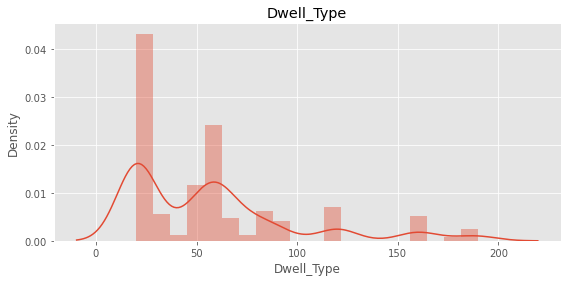

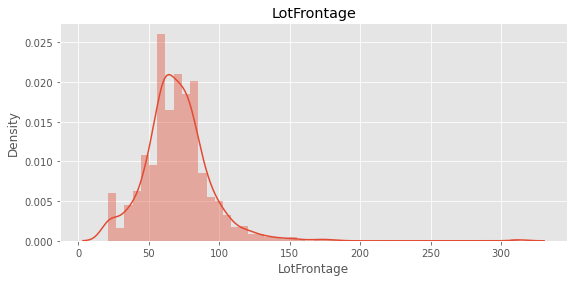

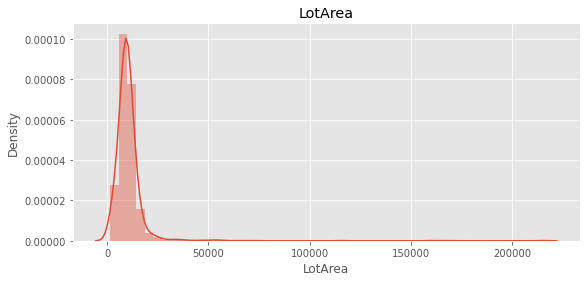

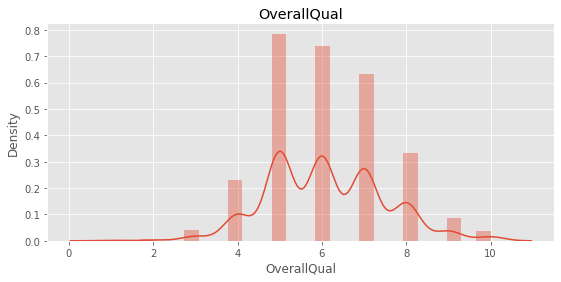

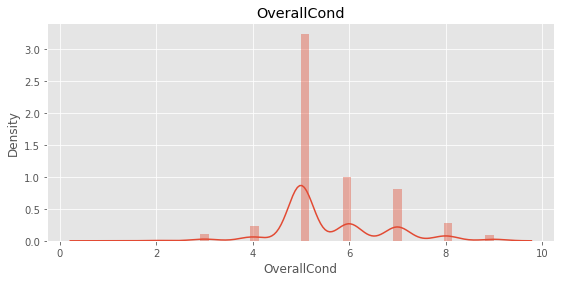

...

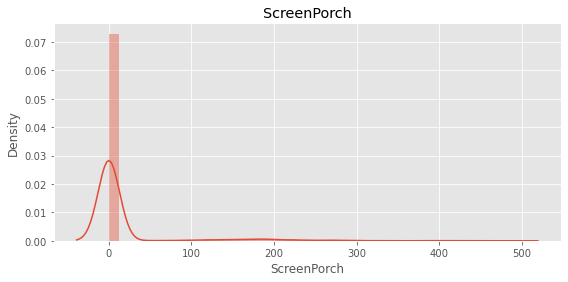

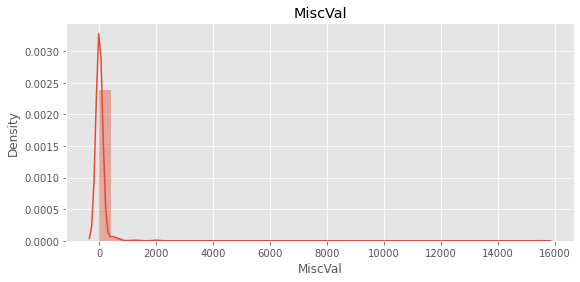

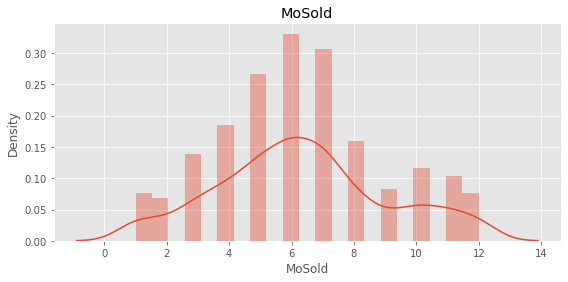

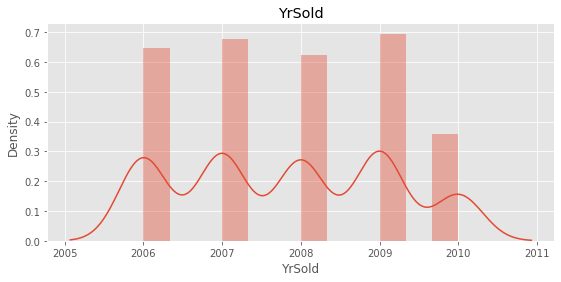

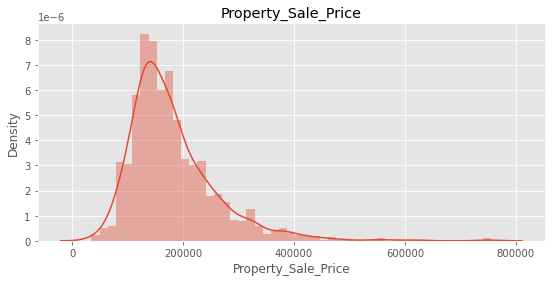

In [14]:
plt.style.use('ggplot')
for column in df_numeric_features:
    plt.figure(figsize=(20,4))
    plt.subplot(121)
    sns.distplot(df_house[column])
    plt.title(column)

### 2. Univariate Analysis of Categorical Variables

We perform the univariate analysis of numerical variables using count plots.

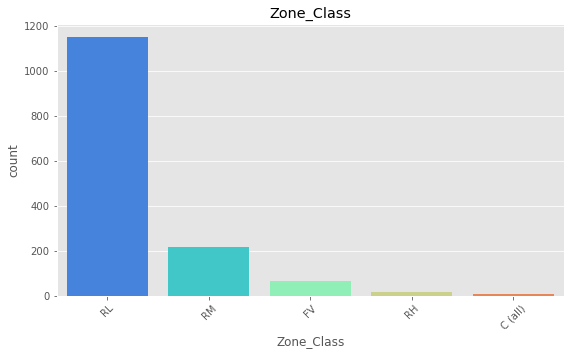

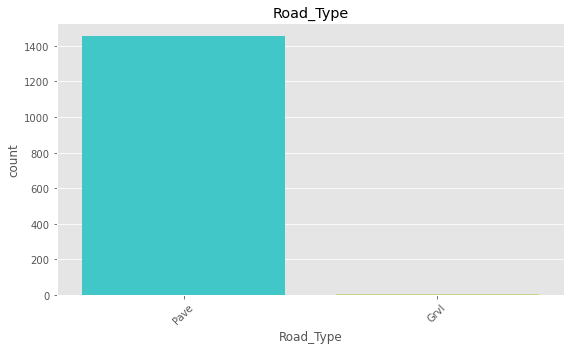

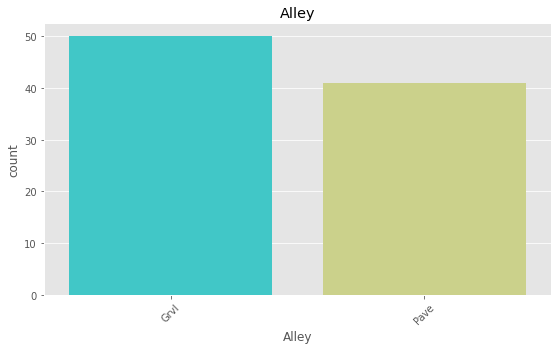

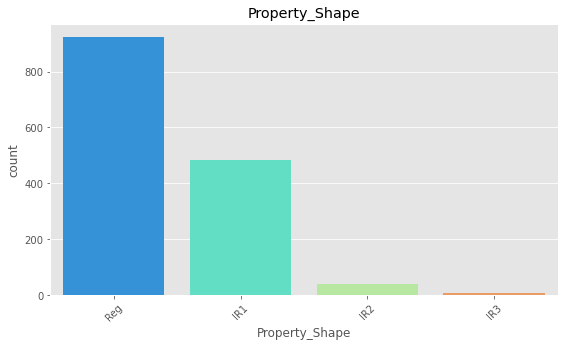

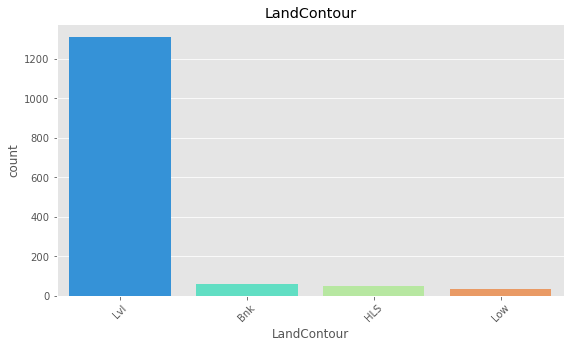

...

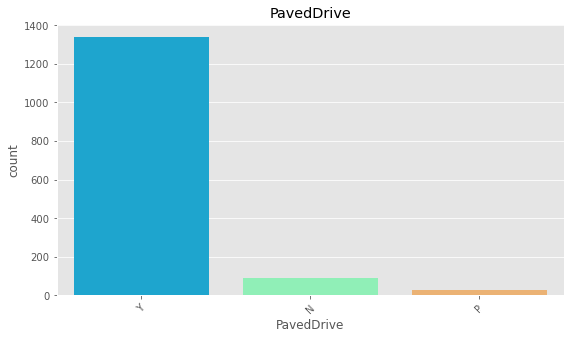

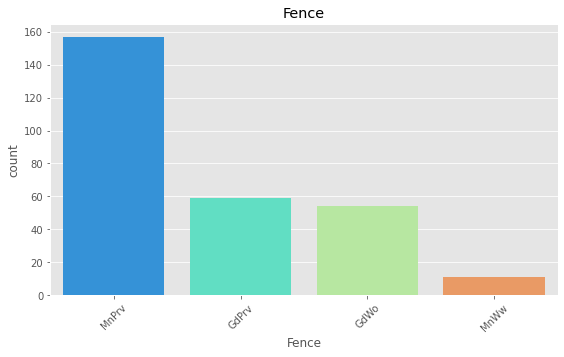

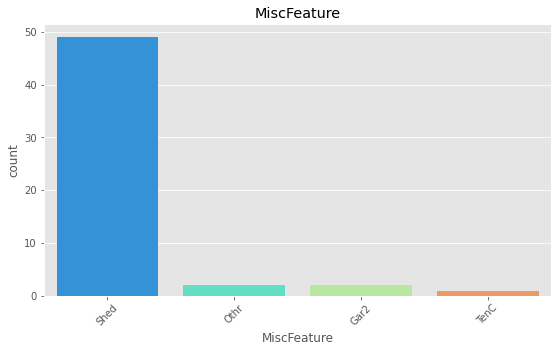

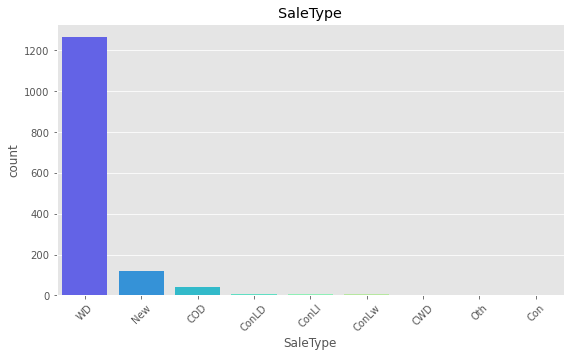

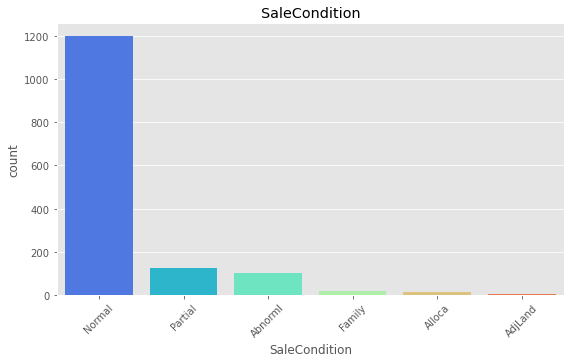

In [15]:
for column in df_categorical_features:
  plt.figure(figsize=(20,5))
  plt.subplot(121)
  sns.countplot(x = column, data = df_house, order = df_house[column].value_counts().index, palette='rainbow')
  plt.xticks(rotation=45)
  plt.title(column)

## 3.5 Bivariate Analysis

### 1. Pairplot between Numerical Variables

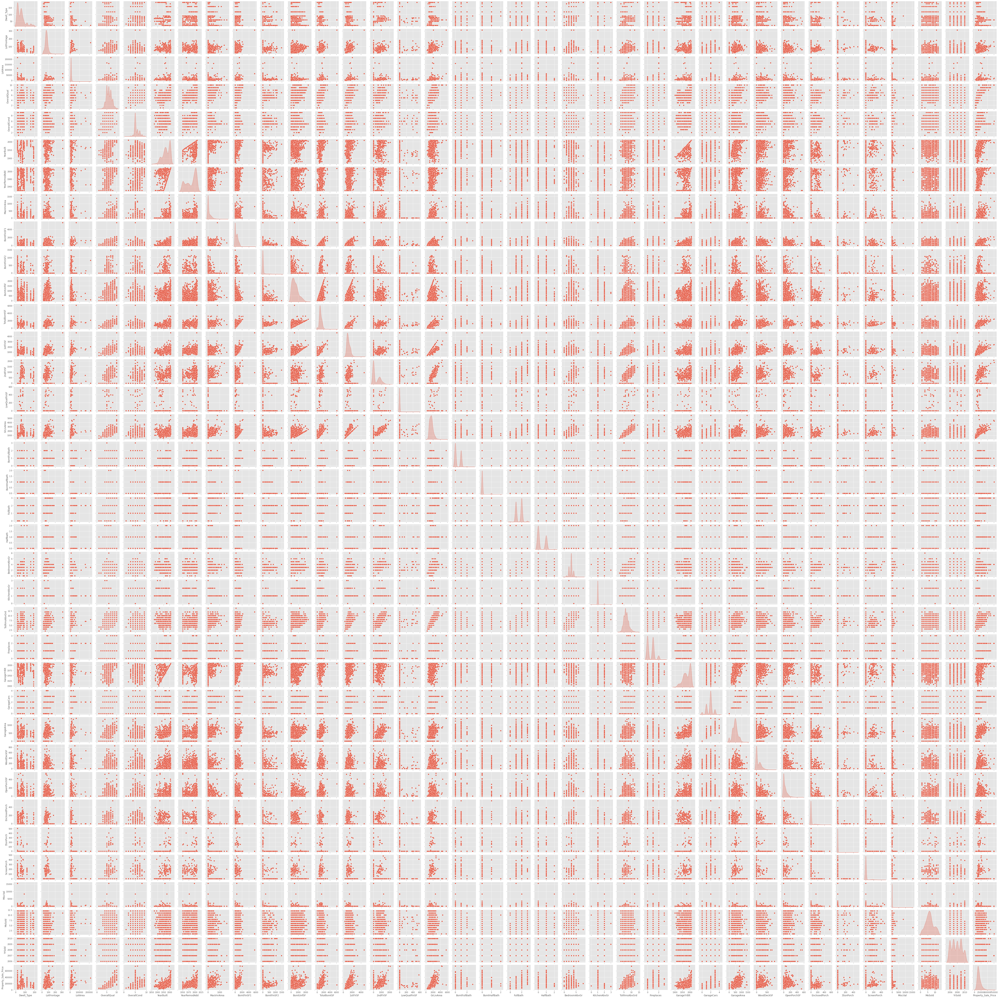

In [17]:
# Pairplot of numeric variables

# draw the pairplot such that the diagonal should be density plot and the other graphs should be scatter plot
sns.pairplot(df_house[df_numeric_features.columns], size=2, kind= "scatter", diag_kind="kde")

# display the plot
plt.show()

<AxesSubplot:xlabel='Property_Sale_Price', ylabel='GrLivArea'>

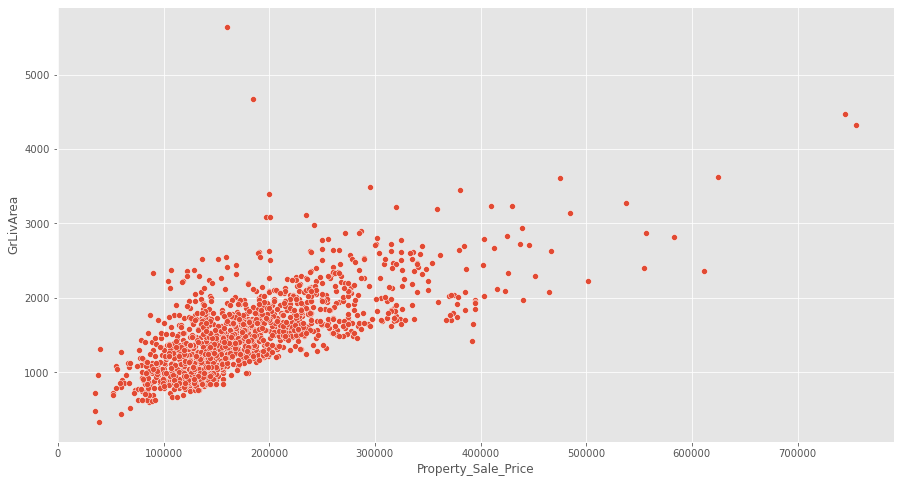

In [18]:
sns.scatterplot(data=df_house, x="Property_Sale_Price", y="GrLivArea")

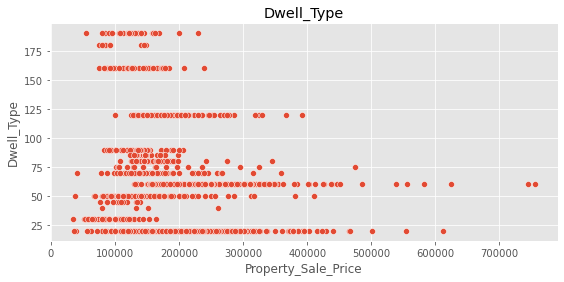

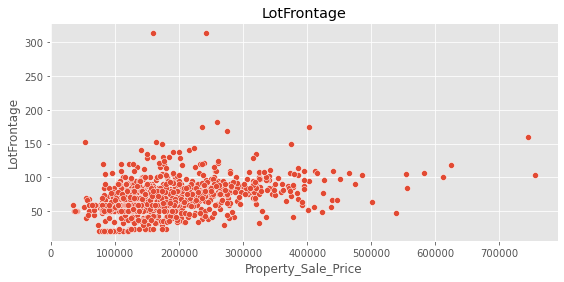

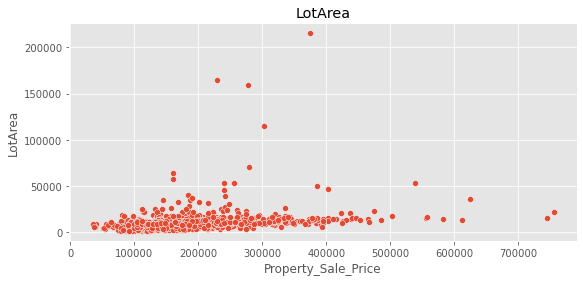

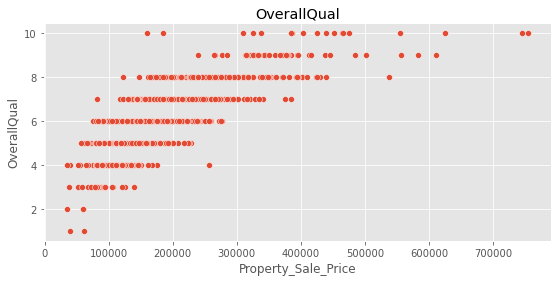

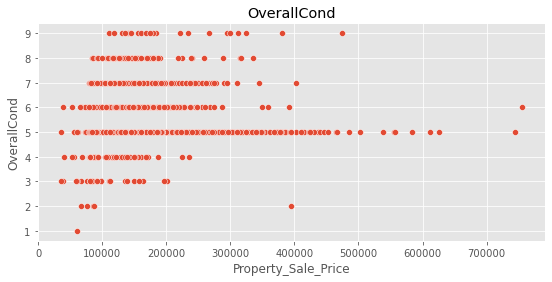

...

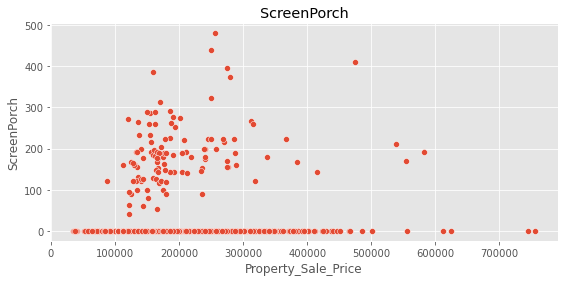

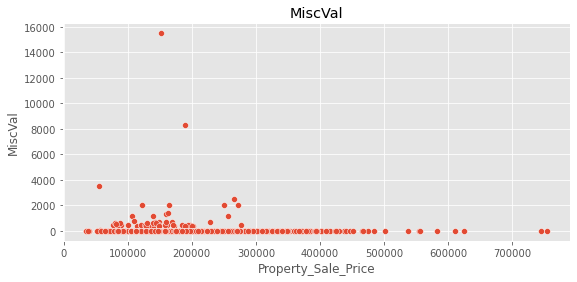

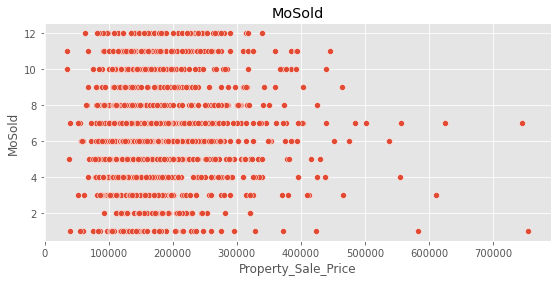

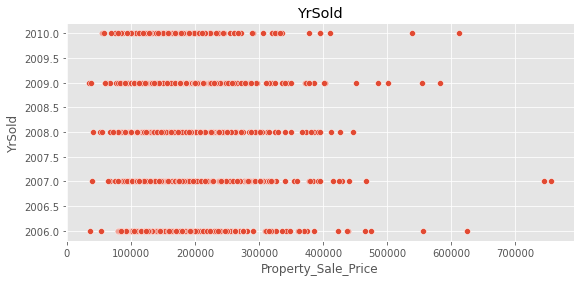

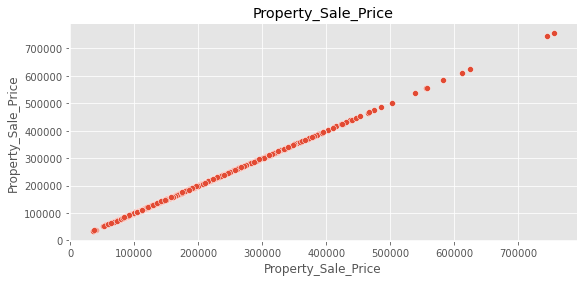

In [20]:
plt.style.use('ggplot')
for column in df_numeric_features:
    plt.figure(figsize=(20,4))
    plt.subplot(121)
    sns.scatterplot(data=df_house, x="Property_Sale_Price", y=column)
    plt.title(column)

### 2. Box Plot between Categorical Variables and Target Variable

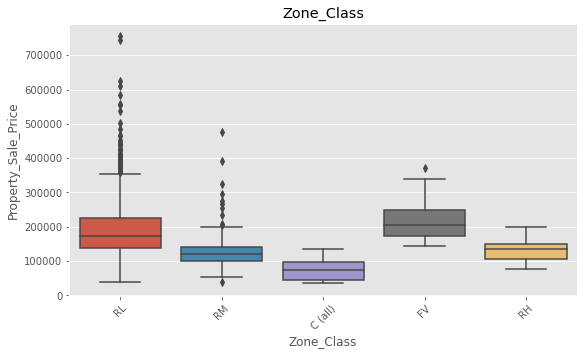

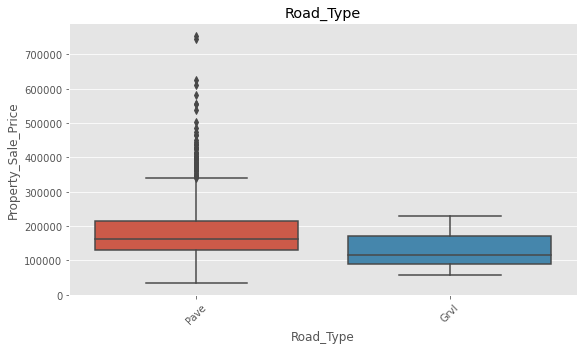

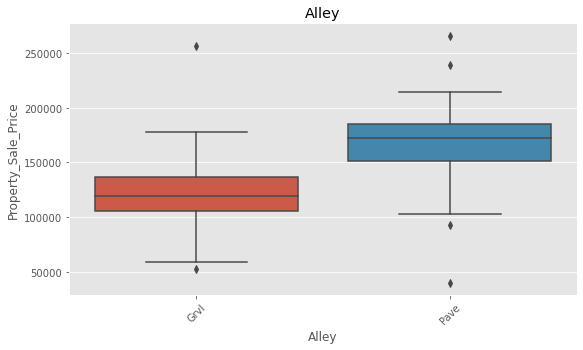

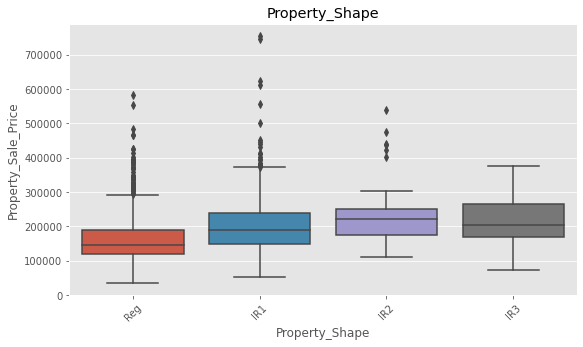

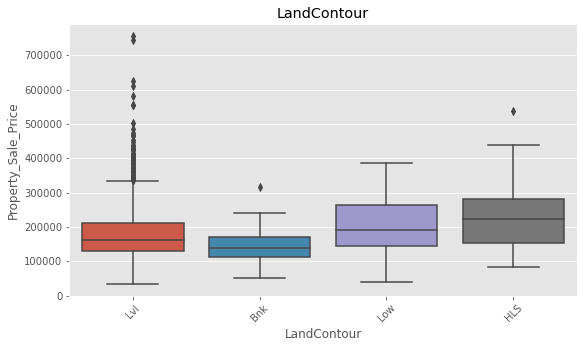

...

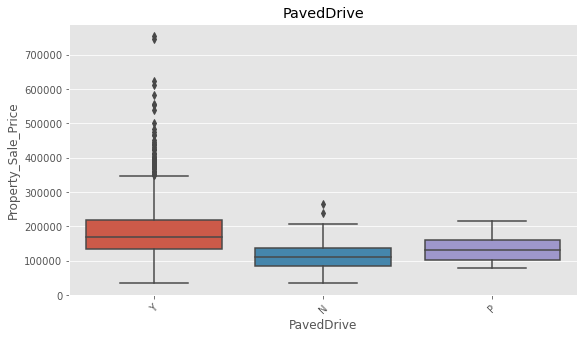

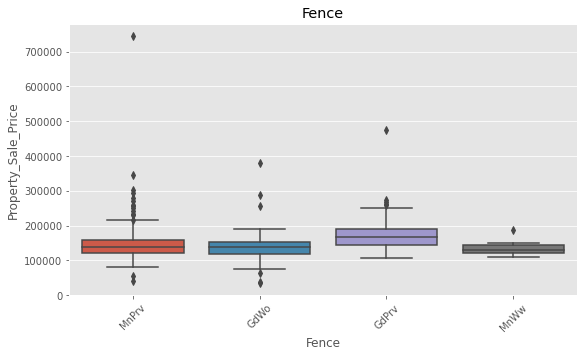

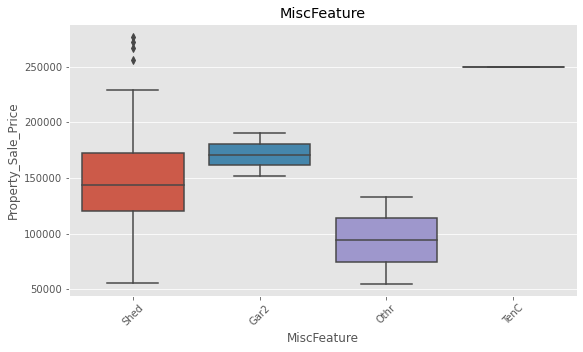

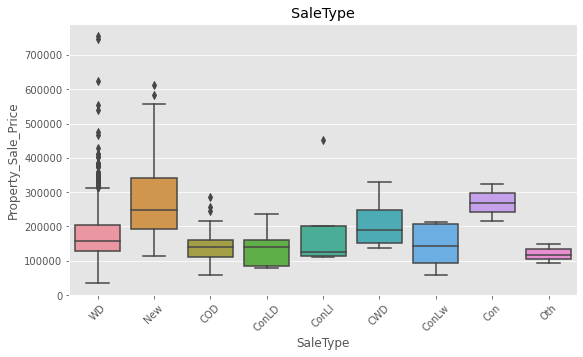

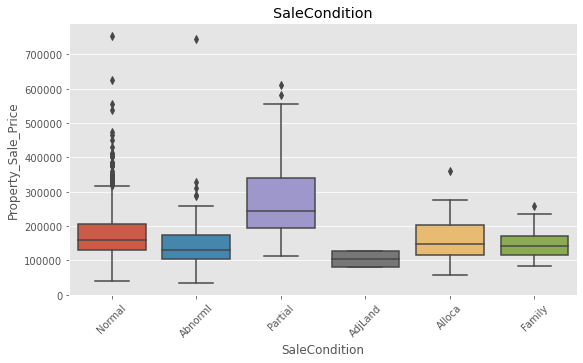

In [19]:
for column in df_categorical_features:
  plt.figure(figsize=(20,5))
  plt.subplot(121)
  sns.boxplot(y="Property_Sale_Price", x=column, data= df_house)
  #sns.countplot(x = column, data = df_house, order = df_house[column].value_counts().index, palette='rainbow')
  plt.xticks(rotation=45)
  plt.title(column)

## 3.6 Omitting Outliers in Target Variable

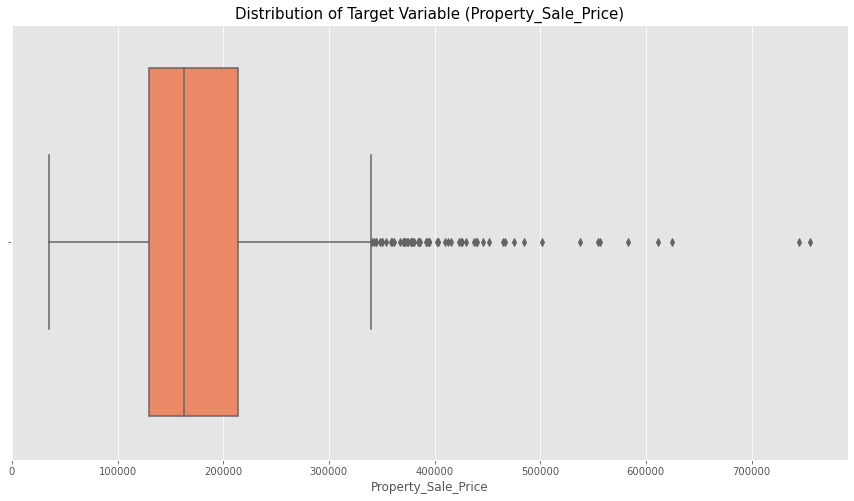

In [21]:
# plot a boxplot of target variable to detect the outliers
sns.boxplot(df_house['Property_Sale_Price'], color='coral')

# set plot label
# set text size using 'fontsize'
plt.title('Distribution of Target Variable (Property_Sale_Price)', fontsize = 15)

# display the plot
plt.show()

The above plot shows that there are extreme observations in the target variable. As these values can affect the prediction of the regression model, we remove such observations before building the model.

In [22]:
# remove the observations with the house price greater than or equal to 500000
# consider all the observations with the Property_Sale_Price less than 500000
df_house = df_house[df_house['Property_Sale_Price'] < 500000]


(1451, 78)

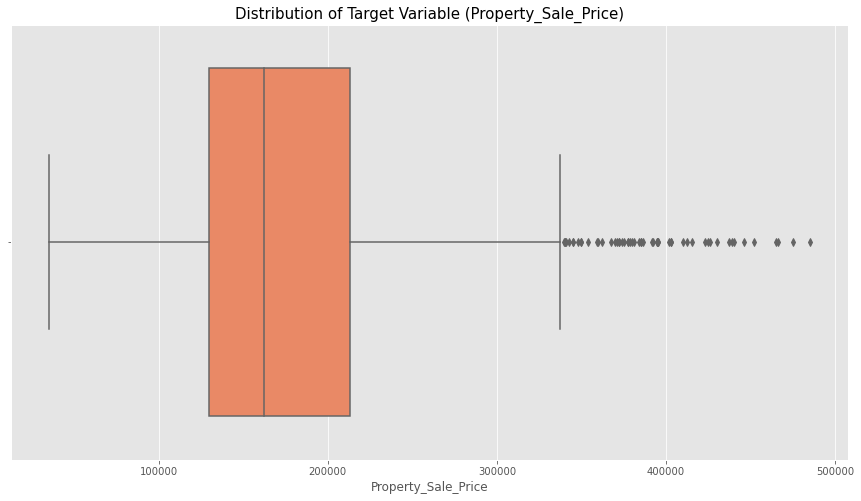

In [23]:
# plot a boxplot of target variable to detect the outliers
sns.boxplot(df_house['Property_Sale_Price'], color='coral')

# set plot label
# set text size using 'fontsize'
plt.title('Distribution of Target Variable (Property_Sale_Price)', fontsize = 15)

# display the plot
plt.show()

In [24]:
# check the dimension of the data
df_house.shape

(1451, 78)

#### The number of observations is reduced to 1451 from 1460 which suggests that we have removed the 9 observations with extremely high house price.

## 3.7 Handling Missing Values

If the missing values are not handled properly we may end up drawing an inaccurate inference about the data.

### 1. Checking Missing Values

In [25]:
# sort the variables on the basis of total null values in the variable
# 'isnull().sum()' returns the number of missing values in each variable
# 'ascending = False' sorts values in the descending order
# the variable with highest number of missing values will appear first
Total = df_house.isnull().sum().sort_values(ascending = False)          

# calculate the percentage of missing values
# 'ascending = False' sorts values in the descending order
# the variable with highest percentage of missing values will appear first
Percent = (df_house.isnull().sum()*100/df_house.isnull().count()).sort_values(ascending = False)   

# concat the 'Total' and 'Percent' columns using 'concat' function
# 'keys' is the list of column names
# 'axis = 1' concats along the columns
missing_data = pd.concat([Total, Percent], axis = 1, keys = ['Total', 'Percentage of Missing Values'])    

# add the column containing data type of each variable
missing_data['Type'] = df_house[missing_data.index].dtypes
missing_data

,Total,Percentage of Missing Values,Type
MiscFeature,1397,96.278429,object
Alley,1360,93.728463,object
Fence,1171,80.702963,object
FireplaceQu,690,47.553411,object
LotFrontage,259,17.849759,float64
GarageCond,81,5.582357,object
GarageType,81,5.582357,object
GarageYrBlt,81,5.582357,float64
GarageFinish,81,5.582357,object
GarageQual,81,5.582357,object


### 2. Visualizing Missing Values using Heat Map

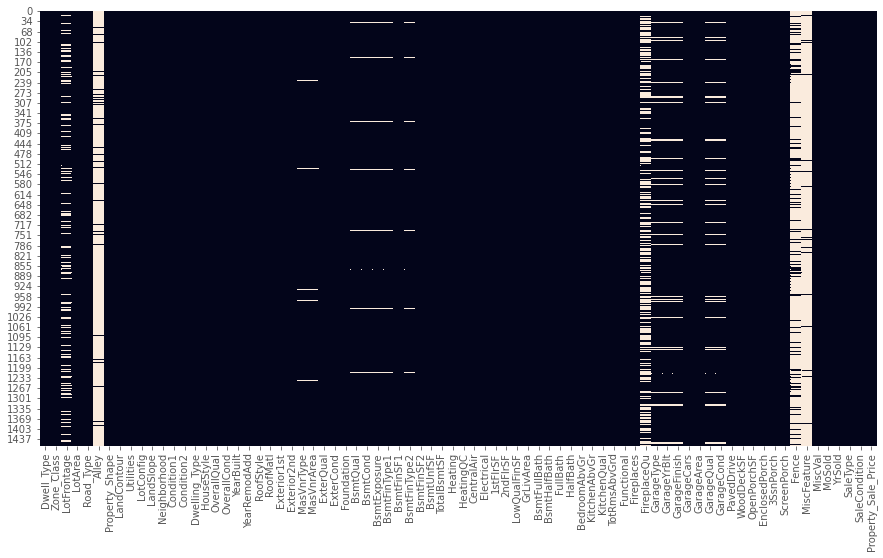

In [26]:
# plot heatmap to visualize the null values in each column
# 'cbar = False' does not show the color axis 
sns.heatmap(df_house.isnull(), cbar=False)

# display the plot
plt.show()

The variables 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu', 'LotFrontage', 'GarageCond', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 'BsmtFinType2', 'BsmtExposure', 'BsmtQual', 'BsmtCond', 'BsmtFinType1', 'MasVnrArea', 'MasVnrType', and 'Electrical' contain missing values.

### 3. Handling Missing Values

#### Handling Missing Values in Numerical Variables

In [27]:
# consider the numeric variables with missing values
# pass the condition to filter the variables with number of missing values greater than zero and numeric data type
num_missing_values = missing_data[(missing_data['Total'] > 0) & (missing_data['Type'] != 'object')]
num_missing_values

,Total,Percentage of Missing Values,Type
LotFrontage,259,17.849759,float64
GarageYrBlt,81,5.582357,float64
MasVnrArea,8,0.551344,float64


For the numerical variables, replace the missing values by their respective mean, median or mode as per the requirement.

#### LotFrontage

In [28]:
# the variable 'LotFrontage' is positively skewed
# fill the missing values with its median value using fillna()
df_house['LotFrontage'] = df_house['LotFrontage'].fillna(df_house['LotFrontage'].median())

#### GarageYrBlt

The dataframe missing_data shows that, all the variables containing the garage information have 81 missing values. This indicates that there are 81 observations for which garage facility is not available. Thus, we replace the missing values in the numeric variable GarageYrBlt by 0.

In [29]:
# replace missing values in 'GarageYrBlt' with 0 using fillna() 
df_house['GarageYrBlt'] = df_house['GarageYrBlt'].fillna(0)

#### MasVnrArea

In [30]:
# the variable 'MasVnrArea' is positively skewed
# fill the missing values with its median value using fillna()
df_house['MasVnrArea'] = df_house['MasVnrArea'].fillna(df_house['MasVnrArea'].median())

#### Handling Missing Values in Numerical Variables

In [31]:
# consider the categoric variables with missing values
# pass the condition to filter the variables with number of missing values greater than zero and categoric data type
cat_missing_values = missing_data[(missing_data['Total'] > 0) & (missing_data['Type'] == 'object')]
cat_missing_values

,Total,Percentage of Missing Values,Type
MiscFeature,1397,96.278429,object
Alley,1360,93.728463,object
Fence,1171,80.702963,object
FireplaceQu,690,47.553411,object
GarageCond,81,5.582357,object
GarageType,81,5.582357,object
GarageFinish,81,5.582357,object
GarageQual,81,5.582357,object
BsmtFinType2,38,2.618884,object
BsmtExposure,38,2.618884,object


#### MiscFeature

In [32]:
# according to the data definition, 'NA' denotes the absence of miscellaneous feature
# replace NA values in 'MiscFeature' with a valid value, 'None'
df_house['MiscFeature'] = df_house['MiscFeature'].fillna('None')

#### Alley

In [33]:
# according to the data definition, 'NA' denotes the absence of alley access
# replace NA values in 'Alley' with a valid value, 'No alley access' 
df_house['Alley'] = df_house['Alley'].fillna('No alley access')

#### Fence

In [34]:
# according to the data definition, 'NA' denotes the absence of fence
# replace NA values in 'Fence' with a valid value, 'No Fence'
df_house['Fence'] = df_house['Fence'].fillna('No Fence')

#### FireplaceQu

In [35]:
# according to the data definition, 'NA' denotes the absence of fireplace
# replace null values in 'FireplaceQu' with a valid value, 'No Fireplace' 
df_house['FireplaceQu'] = df_house['FireplaceQu'].fillna('No Fireplace')

#### GarageCond, GarageType, GarageFinish, GarageQual

The dataframe missing_data shows that, all the variables containing the garage information have 81 missing values. This indicates that there are 81 observations for which garage facility is not available. Thus, we replace the missing values in the categoric variables representing the garage by No Garage.

In [36]:
# use 'for loop' to replace NA values in the below columns with a valid value, 'No Garage' 
# 'inplace = True' replace the null values in the original data
for col in ['GarageCond', 'GarageType', 'GarageFinish', 'GarageQual']:
    df_house[col].fillna('No Garage', inplace = True)

#### BsmtFinType2, BsmtExposure, BsmtQual, BsmtCond, BsmtFinType1

We do same for basement informaton as we did for garage information.

In [37]:
# according to the data definition, 'NA' denotes the absence of basement in the variabels 'BsmtQual', 'BsmtCond', 
# 'BsmtExposure', 'BsmtFinType1','BsmtFinType2'
# use 'for loop' to replace NA values with 'No Basement' in these columns 
# 'inplace = True' replace the null values in the original data
for col in ['BsmtFinType2', 'BsmtExposure', 'BsmtQual','BsmtCond','BsmtFinType1']:
    df_house[col].fillna('No Basement', inplace = True)

#### MasVnrType

In [38]:
# according to the data definition, 'NA' denotes the absence of masonry veneer
# replace NA values in 'MasVnrType' with a valid value, 'None'
df_house['MasVnrType'] = df_house['MasVnrType'].fillna('None')

#### Electrical

In [39]:
# replace the null values in 'Electrical' with its mode
# calculate the mode of the 'Electrical'
mode_electrical = df_house['Electrical'].mode()

# print mode of the 'Electrical'
print(mode_electrical)

0    SBrkr
dtype: object


In [40]:
# replace NA values in 'Electrical' with its mode, i.e. 'SBrkr'
df_house['Electrical'].fillna('SBrkr' , inplace = True)

### 4. Rechecking Null Values after Handling

After replacing the null values for the required variables, recheck the null values.

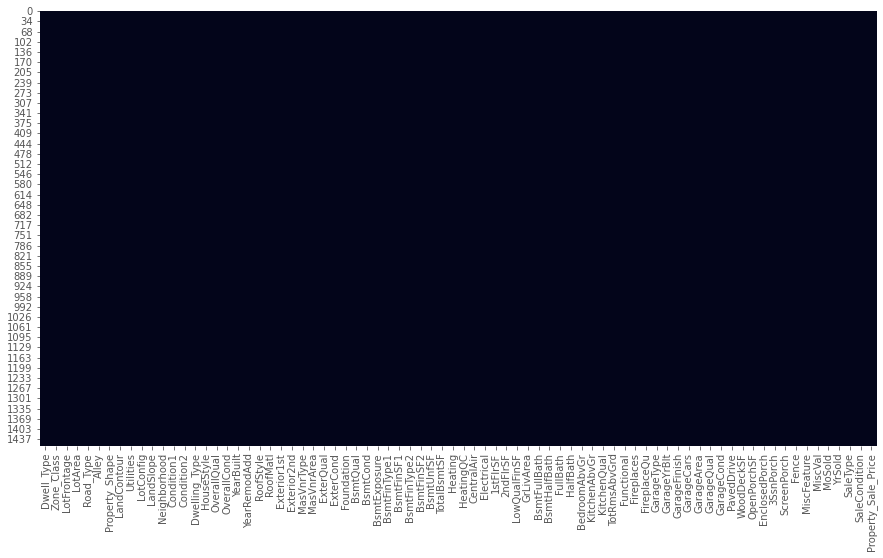

In [41]:
# recheck the null values
# plot heatmap to visualize the null values in each column
# 'cbar = False' does not show the color axis 
sns.heatmap(df_house.isnull(), cbar=False)

# display the plot
plt.show()

#### So from the above plot wee see that there are no more missing values in the data.

## 3.8 Study Correlation

To check the correlation between numerical variables, we perform the following steps:<br><br>
                    1. Compute a correlation matrix  <br>
                    2. Plot a heatmap for the correlation matrix
                    </b>

#### 1. Compute a correlation matrix 

In [42]:
# use the corr() function to generate the correlation matrix of the numeric variables
corrmat = df_house.corr()

# print the correlation matrix
corrmat

,Dwell_Type,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal,MoSold,YrSold,Property_Sale_Price
Dwell_Type,1.000000,-0.359948,-0.140842,0.036824,-0.060231,0.029901,0.042606,0.028596,-0.065768,-0.064352,-0.142594,-0.239002,-0.252503,0.311621,0.046332,0.079566,0.005460,-0.002919,0.134347,0.177671,-0.026687,0.281667,0.044386,-0.043301,-0.080615,-0.037985,-0.096876,-0.014498,-0.005758,-0.012591,-0.044036,-0.025250,-0.007821,-0.014585,-0.019381,-0.085954
LotFrontage,-0.359948,1.000000,0.306226,0.218873,-0.050642,0.110575,0.078240,0.168580,0.201974,0.041758,0.122341,0.351744,0.403928,0.055154,0.038892,0.352795,0.087810,-0.009650,0.166976,0.039602,0.233933,-0.003219,0.311321,0.223229,0.097975,0.261254,0.317880,0.073205,0.133322,0.013371,0.063617,0.035947,0.000464,0.015944,0.009395,0.318744
LotArea,-0.140842,0.306226,1.000000,0.092573,-0.002507,0.007052,0.007963,0.079576,0.204725,0.113638,-0.002229,0.253819,0.293575,0.033593,0.005727,0.248741,0.154564,0.047356,0.111174,0.006873,0.114221,-0.016372,0.175347,0.268811,0.071133,0.145224,0.171107,0.159650,0.084143,-0.015829,0.021493,0.032825,0.039093,0.003327,-0.016991,0.252156
OverallQual,0.036824,0.218873,0.092573,1.000000,-0.087809,0.569569,0.549306,0.389042,0.216929,-0.062754,0.309207,0.519780,0.456487,0.281649,-0.029207,0.577533,0.106587,-0.045858,0.539019,0.268238,0.097513,-0.184125,0.407980,0.386322,0.289973,0.592229,0.552794,0.234836,0.307595,-0.110743,0.032642,0.055887,-0.030682,0.081077,-0.029227,0.802424
OverallCond,-0.060231,-0.050642,-0.002507,-0.087809,1.000000,-0.374705,0.076615,-0.125842,-0.041916,0.040844,-0.137000,-0.168898,-0.141383,0.032440,0.025204,-0.075899,-0.053159,0.116845,-0.192336,-0.059294,0.013622,-0.087629,-0.052043,-0.021176,-0.005742,-0.183182,-0.148636,-0.002397,-0.031102,0.069509,0.025223,0.058424,0.068605,-0.004147,0.045267,-0.072195
YearBuilt,0.029901,0.110575,0.007052,0.569569,-0.374705,1.000000,0.590358,0.308832,0.242388,-0.050381,0.147484,0.385072,0.272635,0.002106,-0.183659,0.188173,0.185755,-0.039128,0.464424,0.239822,-0.073171,-0.174064,0.081196,0.140979,0.271118,0.533519,0.474181,0.223873,0.186221,-0.386450,0.032225,-0.057585,-0.033934,0.016370,-0.016129,0.543898
YearRemodAdd,0.042606,0.078240,0.007963,0.549306,0.076615,0.590358,1.000000,0.170015,0.120246,-0.069146,0.179966,0.284008,0.232100,0.136997,-0.061920,0.283858,0.117521,-0.012512,0.436448,0.180804,-0.041872,-0.148847,0.181722,0.106649,0.145115,0.416036,0.366411,0.205597,0.224186,-0.192517,0.046070,-0.045230,-0.009821,0.025102,0.033392,0.531708
MasVnrArea,0.028596,0.168580,0.079576,0.389042,-0.125842,0.308832,0.170015,1.000000,0.237426,-0.070851,0.116437,0.340365,0.318259,0.150374,-0.069527,0.358948,0.078313,0.015343,0.251721,0.192394,0.099591,-0.036336,0.254011,0.238226,0.133385,0.351166,0.357034,0.145807,0.122038,-0.108352,0.022121,0.057424,-0.029244,0.005738,-0.010231,0.436515
BsmtFinSF1,-0.065768,0.201974,0.204725,0.216929,-0.041916,0.242388,0.120246,0.237426,1.000000,-0.054443,-0.502348,0.506796,0.427145,-0.160550,-0.064339,0.177440,0.652108,0.065858,0.039019,-0.003163,-0.108698,-0.080020,0.016513,0.245847,0.114548,0.209144,0.283615,0.202566,0.112177,-0.099877,0.028548,0.057946,0.004795,-0.010615,0.008691,0.357076
BsmtFinSF2,-0.064352,0.041758,0.113638,-0.062754,0.040844,-0.050381,-0.069146,-0.070851,-0.054443,1.000000,-0.211681,0.101582,0.096551,-0.096758,0.014921,-0.008304,0.158017,0.072546,-0.076080,-0.029227,-0.012647,-0.040788,-0.036589,0.044752,0.035023,-0.039581,-0.017447,0.071761,0.003118,0.036869,-0.030038,0.085238,0.005002,-0.014359,0.030290,-0.014028


#### 2. Plotting heatmap for diagonal correlation matrix

For convenience, we show only the values more than 0.6 or less than -0.6.

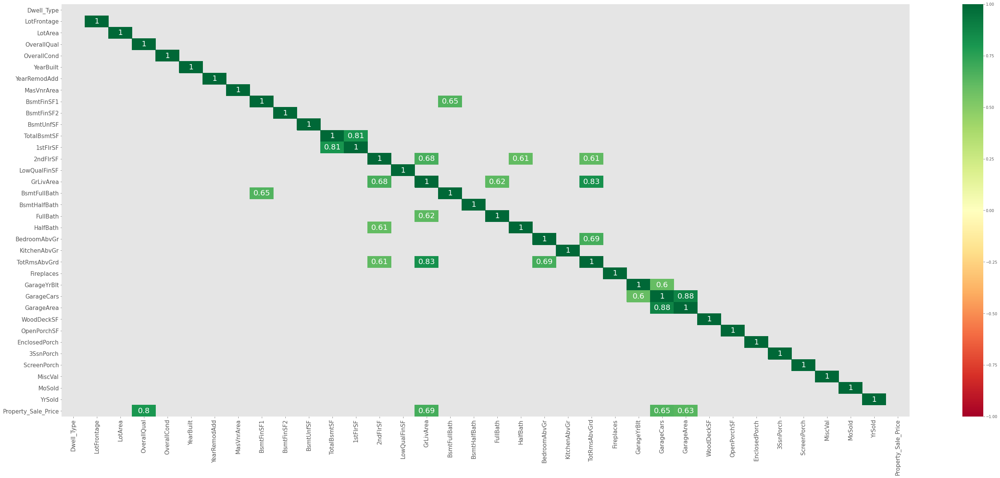

In [45]:
# set figure size
plt.figure(figsize=(50, 20))

# plot the heat map
# corr: give the correlation matrix
# pass the condition to get the strong correlation between the variables
# cmap: color code used for plotting
# vmax: gives a maximum range of values for the chart
# vmin: gives a minimum range of values for the chart
# annot: prints the correlation values in the chart
# annot_kws: sets the font size of the annotation
# mask
mask = np.triu(np.ones_like(corrmat, dtype=np.bool))
# adjust mask and df
mask = mask[1:, :-1]
corr = corrmat.iloc[1:,:-1].copy()
# color map
cmap = sns.diverging_palette(0, 230, 90, 60, as_cmap=True)
#sns.set(font_scale=2)
sns.heatmap(corrmat[(corr >= 0.6) | (corr <= -0.6)], cmap = 'RdYlGn', vmax = 1.0, vmin = -1.0, annot = True, annot_kws={"size": 20})

# set the size of x and y axes labels
# set text size using 'fontsize'
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

# display the plot
plt.show()

The diagonal entries are all '1' which represents the correlation of the variable with itself. The dark blue squares represent the variables with strong positive correlation. <br><br>The above plot shows that there is highest positive correlation (= 0.88) between the variables 'GarageArea' and 'GarageCars'. Also there is strong positive correlation between the pairs (1StFlrSF, TotalBsmtSF) and (TotRmsAbvGrd, GrlivArea). These variables may involved in multicollinearity.<br>
                        No two variables have strong negative correlation in the dataset.

In [46]:
conda install flask

Solving environment: done

# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


In [47]:
pip install flask

Note: you may need to restart the kernel to use updated packages.


In [48]:
pip install Flask

Note: you may need to restart the kernel to use updated packages.
